# AeroCover: Multi-Agent Coordination via Deep Reinforcement Learning
## Version 2

**Author:** Dylan Roy  
**Course:** Reinforcement Learning for Spring 2026  
**Professor:** Dr. Alexander Lowenstein  
**Date:** March 18, 2026

---

## Summary

V1 showed that tabular methods hit a ceiling (best Sarsa(4) avg coverage at about 0.31) because discretization destroys information and prevents generalization.
V2 transitions to deep RL so it operates on raw continuous observations using Stable Baselines3 for DQN, PPO, and SAC.

**Environment:** PettingZoo MPE `simple_spread_v3` · 2 agents · 2 landmarks

**Methods:** DQN, PPO, TD3, SAC

## 1. Setup & Dependencies

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import os
from IPython.display import HTML

from pettingzoo.mpe import simple_spread_v3

import stable_baselines3.common.vec_env.base_vec_env as base_vec_env
_original_seed = base_vec_env.VecEnvWrapper.seed
def _safe_seed(self, seed=None):
    try:
        return _original_seed(self, seed)
    except AttributeError:
        return [seed]
base_vec_env.VecEnvWrapper.seed = _safe_seed

# V1
from aerocover.env_adapters.mpe_to_mp2 import build_mp2_tables_from_mpe
from aerocover.env_adapters.mpe_render import (
    animate_traj, policy_from_state_action_map,
)
from aerocover.tabular.mp2_mdp import MarkovDecisionProcess

# V2
from aerocover.deep.sb3 import DQNConfig, train_dqn, dqn_policy_fn
from aerocover.deep.sb3 import PPOConfig, train_ppo, ppo_policy_fn
from aerocover.utils.evaluation import evaluate_deep_policy
from aerocover.utils.evaluation import (
    collect_coverage_trajectory,
    collect_rollout_auto,
)
from aerocover.utils.analysis import collect_observations
from aerocover.utils.analysis import compute_saliency
from aerocover.viz.visualization_utils import (
    plot_grouped_importance,
    plot_learning_curves,
    plot_coverage_comparison_v2,
    plot_saliency_heatmap,
)
from aerocover.deep.sb3 import SACConfig, train_sac, sac_policy_fn
from aerocover.deep.sb3 import TD3Config, train_td3, td3_policy_fn

from aerocover.utils.storage import save_buffer, extract_sb3_buffer, status
from aerocover.utils.storage import save_checkpoint


plt.style.use("seaborn-v0_8-darkgrid")
sns.set_palette("husl")
%matplotlib inline


In [ ]:

CONFIG = {
    "n_agents": 2,
    "n_landmarks": 2,
    "max_steps": 50,
    "cover_dist": 0.15,
    "seed": 42,
    "n_eval_episodes": 10,
    "eval_seed_start": 5000,
    "n_envs": 1,
    "moving_landmarks": False,  
    "drift_speed": 0.02,
    # V1 baseline
    "v1_grid": 5, "v1_eps": 600, "v1_gamma": 0.9,
    "v1_step_pen": 0.01, "v1_cov_bonus": 3.0,
}

dqn_cfg = DQNConfig(total_timesteps=1_000_000, buffer_size=200_000, batch_size=256, seed=CONFIG["seed"])
ppo_cfg = PPOConfig(total_timesteps=1_000_000, n_steps=128, batch_size=256, seed=CONFIG["seed"])
sac_cfg = SACConfig(total_timesteps=1_000_000, seed=CONFIG["seed"])
td3_cfg = TD3Config(total_timesteps=1_000_000, seed=CONFIG["seed"])


for k, v in CONFIG.items():
    print(f"  {k:20s}: {v}")

  n_agents            : 2
  n_landmarks         : 2
  max_steps           : 50
  cover_dist          : 0.15
  seed                : 42
  n_eval_episodes     : 10
  eval_seed_start     : 5000
  n_envs              : 1
  moving_landmarks    : False
  drift_speed         : 0.02
  v1_grid             : 5
  v1_eps              : 600
  v1_gamma            : 0.9
  v1_step_pen         : 0.01
  v1_cov_bonus        : 3.0


## 2. Problem Formulation - V2 Updates

### 2.1 Continuous Observations

V1 discretized positions into a 5×5 grid ($|\mathcal{S}|=2{,}500$).
V2 feeds the raw 10-dimensional observation vector directly to neural networks.


### 2.2 Parameter Sharing via SuperSuit

SuperSuit's `pettingzoo_env_to_vec_env_v1` converts the multi-agent env into an SB3 `VecEnv` where each agent occupies its own slot. One policy is trained on all slots for automatic parameter sharing.

### 2.3 Stable Baselines3

SB3 provides production-grade, well-tested implementations of DQN, PPO, and A2C with experience replay, target networks, GAE, clipped objectives, etc. so no need to hand-roll training loops. REINFORCE is the one exception that had to be implemented by hand.

## 3. Deep Q-Network (DQN)

In [3]:
print("Training DQN")
dqn_model, dqn_rewards, dqn_info = train_dqn(
    dqn_cfg,
    n_agents=CONFIG["n_agents"],
    n_landmarks=CONFIG["n_landmarks"],
    cover_dist=CONFIG["cover_dist"],
    max_steps=CONFIG["max_steps"],
    n_envs=CONFIG["n_envs"],
)
print(f"  Final 100-ep reward: {np.mean(dqn_rewards[-100:]):.2f}")

Training DQN
  Ep   100 | Mean reward (last 100): -15.51
  Ep   200 | Mean reward (last 100): -14.98
  Ep   300 | Mean reward (last 100): -13.51
  Ep   400 | Mean reward (last 100): -12.01
  Ep   500 | Mean reward (last 100): -13.28
  Ep   600 | Mean reward (last 100): -11.37
  Ep   700 | Mean reward (last 100): -11.73
  Ep   800 | Mean reward (last 100): -12.59
  Ep   900 | Mean reward (last 100): -8.33
  Ep  1000 | Mean reward (last 100): -10.24
  Ep  1100 | Mean reward (last 100): -11.25
  Ep  1200 | Mean reward (last 100): -8.00
  Ep  1300 | Mean reward (last 100): -5.74
  Ep  1400 | Mean reward (last 100): -4.25
  Ep  1500 | Mean reward (last 100): 1.16
  Ep  1600 | Mean reward (last 100): -5.18
  Ep  1700 | Mean reward (last 100): 1.01
  Ep  1800 | Mean reward (last 100): -1.63
  Ep  1900 | Mean reward (last 100): -0.77
  Ep  2000 | Mean reward (last 100): -1.81
  Ep  2100 | Mean reward (last 100): 3.12
  Ep  2200 | Mean reward (last 100): 1.07
  Ep  2300 | Mean reward (last 100)

## 4. Proximal Policy Optimization (PPO)


In [4]:
print("Training PPO")
ppo_model, ppo_rewards, ppo_info = train_ppo(
    ppo_cfg,
    n_agents=CONFIG["n_agents"],
    n_landmarks=CONFIG["n_landmarks"],
    cover_dist=CONFIG["cover_dist"],
    max_steps=CONFIG["max_steps"],
    n_envs=CONFIG["n_envs"],
)
print(f"  Final 100-ep reward: {np.mean(ppo_rewards[-100:]):.2f}")

Training PPO


/home/megrad/Documents/GitHub/AeroCover/venv/lib/python3.12/site-packages/stable_baselines3/common/on_policy_algorithm.py:150: UserWarning: You are trying to run PPO on the GPU, but it is primarily intended to run on the CPU when not using a CNN policy (you are using ActorCriticPolicy which should be a MlpPolicy). See https://github.com/DLR-RM/stable-baselines3/issues/1245 for more info. You can pass `device='cpu'` or `export CUDA_VISIBLE_DEVICES=` to force using the CPU.Note: The model will train, but the GPU utilization will be poor and the training might take longer than on CPU.
  warnings.warn(


  Ep   100 | Mean reward (last 100): -15.88
  Ep   200 | Mean reward (last 100): -11.74
  Ep   300 | Mean reward (last 100): -8.91
  Ep   400 | Mean reward (last 100): -7.06
  Ep   500 | Mean reward (last 100): -6.43
  Ep   600 | Mean reward (last 100): -9.94
  Ep   700 | Mean reward (last 100): -6.65
  Ep   800 | Mean reward (last 100): -6.17
  Ep   900 | Mean reward (last 100): -3.69
  Ep  1000 | Mean reward (last 100): -3.67
  Ep  1100 | Mean reward (last 100): -6.71
  Ep  1200 | Mean reward (last 100): -7.54
  Ep  1300 | Mean reward (last 100): -4.57
  Ep  1400 | Mean reward (last 100): -4.18
  Ep  1500 | Mean reward (last 100): -6.59
  Ep  1600 | Mean reward (last 100): -5.64
  Ep  1700 | Mean reward (last 100): -3.12
  Ep  1800 | Mean reward (last 100): -0.65
  Ep  1900 | Mean reward (last 100): -0.07
  Ep  2000 | Mean reward (last 100): -4.21
  Ep  2100 | Mean reward (last 100): 3.86
  Ep  2200 | Mean reward (last 100): -2.44
  Ep  2300 | Mean reward (last 100): -4.53
  Ep  2400

## 5. Twin Delayed DDPG (TD3)

In [ ]:
print("Training TD3")
td3_model, td3_rewards, td3_info = train_td3(
    td3_cfg, 
    CONFIG["n_agents"], 
    CONFIG["n_landmarks"], 
    CONFIG["cover_dist"], 
    CONFIG["max_steps"]
)
print(f"  Final 100-ep reward: {np.mean(td3_rewards[-100:]):.2f}")

Training TD3
  Ep   100 | Mean reward (last 100): -30.88
  Ep   200 | Mean reward (last 100): -13.03
  Ep   300 | Mean reward (last 100): -8.42
  Ep   400 | Mean reward (last 100): -8.70
  Ep   500 | Mean reward (last 100): -7.40
  Ep   600 | Mean reward (last 100): -2.21
  Ep   700 | Mean reward (last 100): 1.31
  Ep   800 | Mean reward (last 100): -0.82
  Ep   900 | Mean reward (last 100): -0.34
  Ep  1000 | Mean reward (last 100): -2.43
  Ep  1100 | Mean reward (last 100): 0.54
  Ep  1200 | Mean reward (last 100): 0.06
  Ep  1300 | Mean reward (last 100): 4.52
  Ep  1400 | Mean reward (last 100): 3.01
  Ep  1500 | Mean reward (last 100): 0.78
  Ep  1600 | Mean reward (last 100): 0.96
  Ep  1700 | Mean reward (last 100): 1.77
  Ep  1800 | Mean reward (last 100): 3.80
  Ep  1900 | Mean reward (last 100): 9.41
  Ep  2000 | Mean reward (last 100): 11.70
  Ep  2100 | Mean reward (last 100): 20.79
  Ep  2200 | Mean reward (last 100): 17.76
  Ep  2300 | Mean reward (last 100): 27.01
  Ep  

## 6. Soft Actor Critic (SAC)

In [ ]:
print("Training SAC")
sac_model, sac_rewards, sac_info = train_sac(
    sac_cfg, 
    CONFIG["n_agents"], 
    CONFIG["n_landmarks"], 
    CONFIG["cover_dist"], 
    CONFIG["max_steps"]
)
print(f"  Final 100-ep reward: {np.mean(sac_rewards[-100:]):.2f}")

Training SAC
  Ep   100 | Mean reward (last 100): -13.32
  Ep   200 | Mean reward (last 100): -11.18
  Ep   300 | Mean reward (last 100): -4.70
  Ep   400 | Mean reward (last 100): -2.52
  Ep   500 | Mean reward (last 100): -0.29
  Ep   600 | Mean reward (last 100): 1.62
  Ep   700 | Mean reward (last 100): 5.13
  Ep   800 | Mean reward (last 100): 4.22
  Ep   900 | Mean reward (last 100): 14.35
  Ep  1000 | Mean reward (last 100): 6.67
  Ep  1100 | Mean reward (last 100): 12.42
  Ep  1200 | Mean reward (last 100): 13.78
  Ep  1300 | Mean reward (last 100): 14.10
  Ep  1400 | Mean reward (last 100): 15.32
  Ep  1500 | Mean reward (last 100): 9.72
  Ep  1600 | Mean reward (last 100): 17.39
  Ep  1700 | Mean reward (last 100): 16.54
  Ep  1800 | Mean reward (last 100): 31.42
  Ep  1900 | Mean reward (last 100): 19.47
  Ep  2000 | Mean reward (last 100): 32.08
  Ep  2100 | Mean reward (last 100): 28.82
  Ep  2200 | Mean reward (last 100): 25.46
  Ep  2300 | Mean reward (last 100): 34.11
 

## 7. Learning Curves

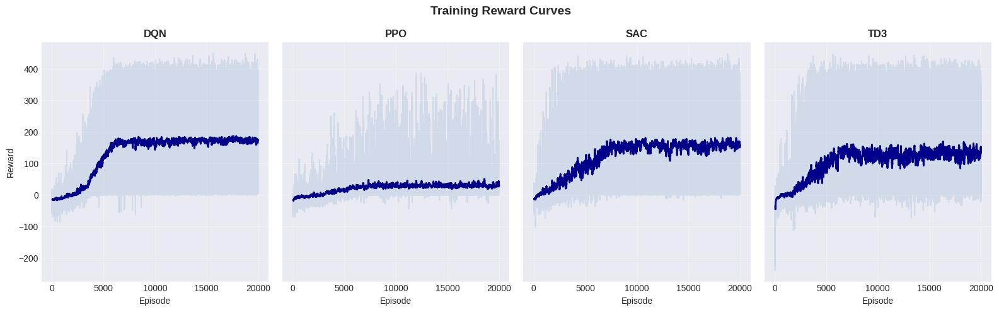

In [7]:
fig = plot_learning_curves({
    "DQN": dqn_rewards,
    "PPO": ppo_rewards,
    "SAC": sac_rewards,
    "TD3": td3_rewards,
})
plt.show()

## 8. Policy Evaluation

Each policy is evaluated over 10 episodes with fixed seeds.

In [8]:
# Build all policy functions with their action space type
all_policies = {
    # (policy_fn, is_continuous)
    "DQN": (dqn_policy_fn(dqn_model), False),
    "PPO": (ppo_policy_fn(ppo_model), False),
    "TD3": (td3_policy_fn(td3_model), True),
    "SAC": (sac_policy_fn(sac_model), True),
    "Random": (lambda obs: None, False),
}

discrete_policies = {}
continuous_policies = {}

for key in all_policies:
    fn, is_continuous = all_policies[key]

    if is_continuous:
        continuous_policies[key] = fn
    else:
        discrete_policies[key] = fn

# Evaluate all
eval_metrics = {}
for name, (pfn, is_cont) in all_policies.items():
    eval_metrics[name] = evaluate_deep_policy(
        pfn,
        n_episodes=CONFIG["n_eval_episodes"],
        n_agents=CONFIG["n_agents"],
        n_landmarks=CONFIG["n_landmarks"],
        max_steps=CONFIG["max_steps"],
        cover_dist=CONFIG["cover_dist"],
        seed_start=CONFIG["eval_seed_start"],
        continuous_actions=is_cont,
    )

print(f"\n{'Method':<20} {'Avg Cov':>12} {'Efficiency':>12}")
for n, m in eval_metrics.items():
    print(f"{n:<20} {m['avg_coverage_mean']:>8.3f}+/-{m['avg_coverage_std']:.3f}"
          f"  {m['efficiency_mean']:>8.1%}+/-{m['efficiency_std']:.1%}")


Method                    Avg Cov   Efficiency
DQN                     1.670+/-0.135     79.0%+/-8.9%
PPO                     0.692+/-0.216      0.0%+/-0.0%
TD3                     1.174+/-0.579     42.6%+/-38.3%
SAC                     1.474+/-0.327     60.6%+/-28.7%
Random                  0.074+/-0.094      1.0%+/-3.0%


### 8.1 V1 Tabular Baseline

In [9]:
print("Building V1 MDP")
v1_s, v1_a, v1_t, v1_r = build_mp2_tables_from_mpe(
    episodes=CONFIG["v1_eps"], 
    max_steps=CONFIG["max_steps"],
    grid=CONFIG["v1_grid"], 
    cover_dist=CONFIG["cover_dist"],
    n_agents=CONFIG["n_agents"], 
    n_landmarks=CONFIG["n_landmarks"],
    seed=CONFIG["seed"], 
    step_penalty=CONFIG["v1_step_pen"],
    coverage_bonus=CONFIG["v1_cov_bonus"],
)
v1_mdp = MarkovDecisionProcess(v1_s, v1_a, v1_t, v1_r, CONFIG["v1_gamma"])
v1_mdp.value_iteration(tolerance=1e-6, max_iter=10000)

v1_pol = policy_from_state_action_map(
    v1_mdp.policy, 
    CONFIG["n_landmarks"], 
    CONFIG["n_agents"],
    CONFIG["v1_grid"], 
    CONFIG["cover_dist"],
)

eval_metrics["V1: Value Iter"] = evaluate_deep_policy(
    v1_pol, 
    n_episodes=CONFIG["n_eval_episodes"],
    n_agents=CONFIG["n_agents"], 
    n_landmarks=CONFIG["n_landmarks"],
    max_steps=CONFIG["max_steps"], 
    cover_dist=CONFIG["cover_dist"],
    seed_start=CONFIG["eval_seed_start"],
)

print(f"\nV1 baseline avg coverage: "
      f"{eval_metrics['V1: Value Iter']['avg_coverage_mean']:.3f}")

Building V1 MDP

Exploration Statistics:
  Coverage 00 (0/2): 625 states (32.8%)
  Coverage 01 (1/2): 521 states (27.4%)
  Coverage 10 (1/2): 551 states (28.9%)
  Coverage 11 (2/2): 207 states (10.9%)
  VI iter 0: delta = 50.920196
  VI iter 10: delta = 14.607059
  VI iter 20: delta = 5.093167
  VI iter 30: delta = 1.775877
  VI iter 40: delta = 0.619210
  VI iter 50: delta = 0.215905
  VI iter 60: delta = 0.075281
  VI iter 70: delta = 0.026249
  VI iter 80: delta = 0.009152
  VI iter 90: delta = 0.003191
  VI iter 100: delta = 0.001113
  VI iter 110: delta = 0.000388
  VI iter 120: delta = 0.000135
  VI iter 130: delta = 0.000047
  VI iter 140: delta = 0.000016
  VI iter 150: delta = 0.000006
  VI iter 160: delta = 0.000002
Value iteration converged in 168 iterations

V1 baseline avg coverage: 0.058


In [10]:
rand_cov = eval_metrics["Random"]["avg_coverage_mean"]
print(f"{'CROSS-VERSION COMPARISON':^60}")
print(f"\n{'Method':<22} {'Ver':>4} {'Avg Cov':>10} {'vs Random':>14}")

for name, m in eval_metrics.items():
    if "V1" in name:
        ver = "V1"
    elif "Random" in name:
        ver = "—"
    else:
        ver = "V2"
        
    cov = m["avg_coverage_mean"]
    imp = ((cov - rand_cov) / max(rand_cov, 1e-3)) * 100
    print(f"{name:<22} {ver:>4} {cov:>10.3f} {imp:>+12.1f}%")

best_v2 = None
best_score = float("-inf")

for name in eval_metrics:
    if "Random" in name or "V1" in name:
        continue

    score = eval_metrics[name]["avg_coverage_mean"]

    if score > best_score:
        best_score = score
        best_v2 = name
        
print(f"\nBest Deep RL method: {best_v2}")

                  CROSS-VERSION COMPARISON                  

Method                  Ver    Avg Cov      vs Random
DQN                      V2      1.670      +2156.8%
PPO                      V2      0.692       +835.1%
TD3                      V2      1.174      +1486.5%
SAC                      V2      1.474      +1891.9%
Random                    —      0.074         +0.0%
V1: Value Iter           V1      0.058        -21.6%

Best Deep RL method: DQN


## 9. Coverage Over Time

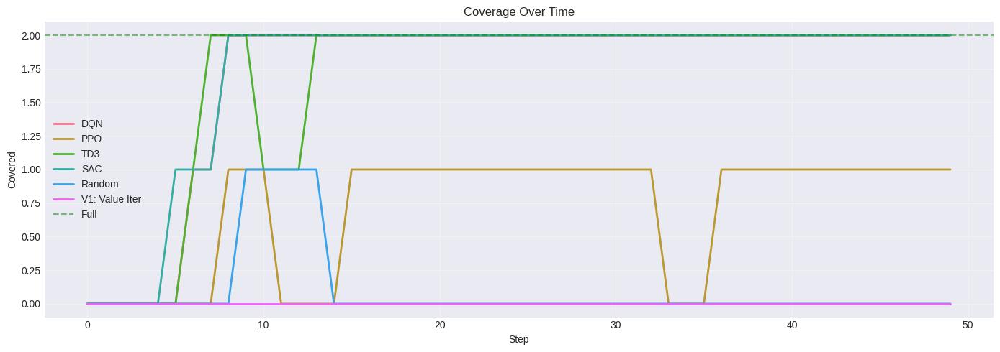

In [11]:
cov_trajs = {}
for name, (pfn, is_cont) in all_policies.items():
    cov_trajs[name] = collect_coverage_trajectory(
        pfn, seed=2026,
        n_agents=CONFIG["n_agents"], 
        n_landmarks=CONFIG["n_landmarks"],
        max_steps=CONFIG["max_steps"], 
        cover_dist=CONFIG["cover_dist"],
        continuous_actions=is_cont,
    )

if "v1_pol" in locals():
    cov_trajs["V1: Value Iter"] = collect_coverage_trajectory(
        v1_pol, seed=2026,
        n_agents=CONFIG["n_agents"],
        n_landmarks=CONFIG["n_landmarks"],
        max_steps=CONFIG["max_steps"], 
        cover_dist=CONFIG["cover_dist"],
    )

fig, ax = plt.subplots(figsize=(14, 5))
plot_coverage_comparison_v2(cov_trajs, n_landmarks=CONFIG["n_landmarks"], ax=ax)
plt.tight_layout()
plt.show()

## 10. Evaluation Metrics

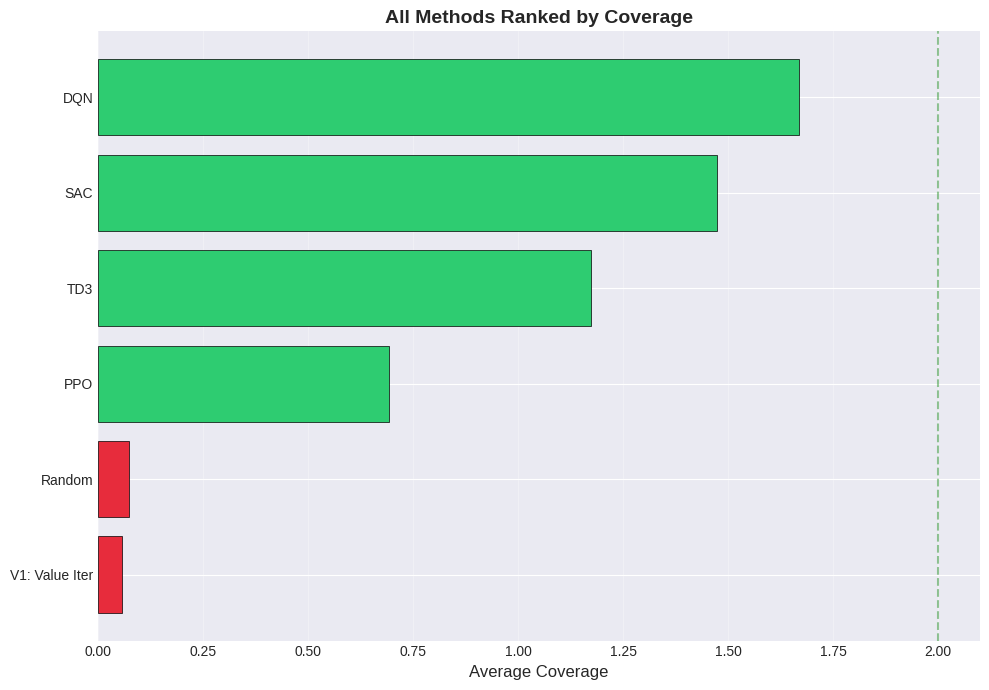

In [12]:
fig, ax = plt.subplots(figsize=(10, 7))

sorted_methods = []
for name in eval_metrics:
    sorted_methods.append(name)

sorted_methods.sort(
    key=lambda name: eval_metrics[name]["avg_coverage_mean"]
)

names = []
vals = []

for name in sorted_methods:
    names.append(name)
    vals.append(eval_metrics[name]["avg_coverage_mean"])

colors = []
for name in names:
    if "Random" in name or "V1" in name:
        colors.append("#e72c3c")  
    else:
        colors.append("#2ecc71")  

ax.barh(
    names,
    vals,
    color=colors,
    edgecolor="k",
    linewidth=0.5
)

ax.axvline(
    CONFIG["n_landmarks"],
    linestyle="--",
    color="green",
    alpha=0.4,
    label="Full Coverage"
)

ax.set_xlabel("Average Coverage", fontsize=12)
ax.set_title("All Methods Ranked by Coverage", fontsize=14, fontweight="bold")
ax.grid(True, axis="x", alpha=0.3)
plt.tight_layout()
plt.show()

## 11. Trajectory Visualization

In [13]:
for name, (pfn, is_cont) in all_policies.items():
    if "Random" in name:
        continue

    print(f"  {name} ({'continuous' if is_cont else 'discrete'})")

    viz = collect_rollout_auto(
        pfn, 
        is_cont, 
        seed=2026,
        n_agents=CONFIG["n_agents"], 
        n_landmarks=CONFIG["n_landmarks"],
        max_steps=CONFIG["max_steps"]
    )

    anim = animate_traj(viz, cover_dist=CONFIG["cover_dist"], interval_ms=150)
    display(HTML(anim.to_jshtml()))

  DQN (discrete)


  PPO (discrete)


  TD3 (continuous)


  SAC (continuous)


## 12. Saliency 

Collected 440 observation samples
DQN: OK
PPO: OK
TD3: OK
SAC: OK


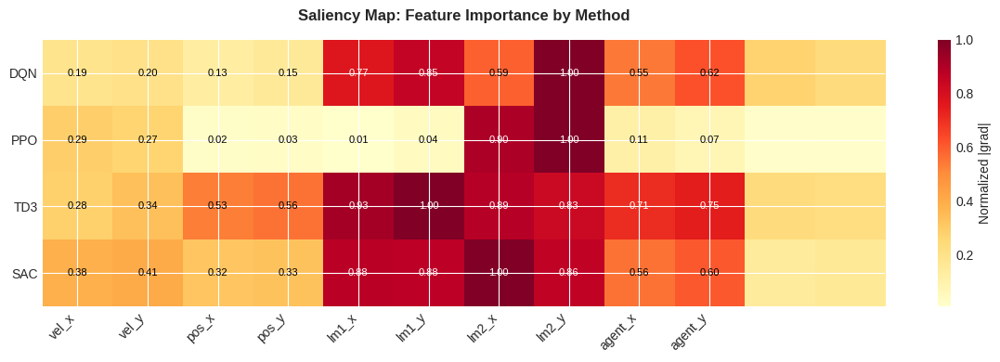

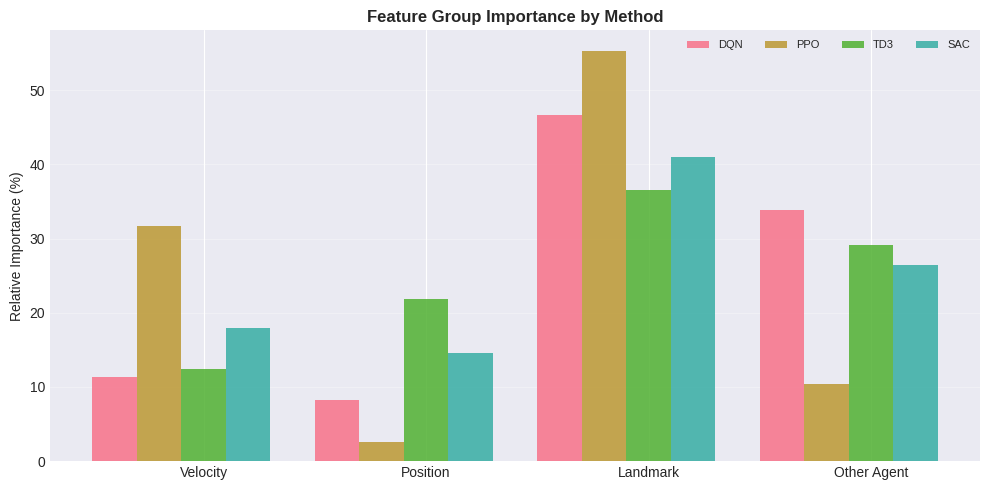

In [14]:
obs_samples = collect_observations(CONFIG)
print(f"Collected {len(obs_samples)} observation samples")

saliency_methods = {
    "DQN": (dqn_model, "dqn"),
    "PPO": (ppo_model, "sb3_ac"),
    "TD3": (td3_model, "sb3_continuous"),
    "SAC": (sac_model, "sb3_continuous"),
}

saliency_results = {}

for name, (model, method) in saliency_methods.items():
    try:
        saliency_results[name] = compute_saliency(model, obs_samples, method)
        print(f"{name}: OK")
    except Exception as e:
        print(f"{name}: FAILED ({e})")

plot_saliency_heatmap(saliency_results)
plot_grouped_importance(saliency_results)

In [15]:
for name, model in [("dqn", dqn_model),
                        ("td3", td3_model), ("sac", sac_model)]:
    try:
        buf = extract_sb3_buffer(model, n_samples=10000)
        save_buffer(buf, algo=name, task="coverage")
    except Exception as e:
        print(f"  {name}: {e}")

status()

Saved replay/dqn/coverage/2026-03-24_15-05-46_latest.pkl (2188 KB)
Saved replay/td3/coverage/2026-03-24_15-05-46_latest.pkl (2422 KB)
Saved replay/sac/coverage/2026-03-24_15-05-46_latest.pkl (2422 KB)
  ddpg/coverage: 1 files, 2.4 MB
  double_dqn/coverage: 1 files, 2.1 MB
  dqn/coverage: 2 files, 4.3 MB
  sac/coverage: 2 files, 4.7 MB
  td3/coverage: 2 files, 4.7 MB

Total: 18.2 MB


## 13. Model Persistence

In [16]:
for name, model, cfg in [
    ("dqn", dqn_model, dqn_cfg),
    ("ppo", ppo_model, ppo_cfg),
    ("td3", td3_model, td3_cfg),
    ("sac", sac_model, sac_cfg),
]:
    save_checkpoint(model, cfg, algo=name)

os.makedirs("checkpoints/v1_value_iter/coverage/best", exist_ok=True)
v1_mdp.save_best("checkpoints/v1_value_iter/coverage/best/policy.pkl")

print("\nCheckpoint structure:")
for root, dirs, files in os.walk("checkpoints"):
    level = root.replace("checkpoints", "").count(os.sep)
    indent = "  " * level
    print(f"{indent}{os.path.basename(root)}/")
    for f in files:
        print(f"{indent}  {f}")

  Saved dqn/coverage/best
  Saved ppo/coverage/best
  Saved td3/coverage/best
  Saved sac/coverage/best
Saved policy (1904 states) to checkpoints/v1_value_iter/coverage/best/policy.pkl

Checkpoint structure:
checkpoints/
  td3/
    coverage/
      best/
        model.zip
        config.json
  reinforce/
    coverage/
      best/
        model.pt
        config.json
  a2c/
    coverage/
      best/
        model.zip
        config.json
  double_dqn/
    coverage/
      best/
        model.zip
        config.json
  ddpg/
    coverage/
      best/
        model.zip
        config.json
  dqn/
    coverage/
      best/
        model.zip
        config.json
  trpo/
    coverage/
      best/
        model.zip
        config.json
  sac/
    coverage/
      best/
        model.zip
        config.json
  v1_value_iter/
    coverage/
      best/
        policy.pkl
  ppo/
    coverage/
      best/
        model.zip
        config.json


## 14. Discussion & Limitations

### What Improved Over V1

Continuous state input eliminates the discretization bottleneck that capped V1 performance at ~0.31 average coverage.

Generalization via neural networks allows nearby observations to share learned representations thus resolving V1's per-state independence.


### Method-Specific Notes

| Method | Strengths | Weaknesses |
|--------|-----------|------------|
| DQN | Sample-efficient (replay buffer) | Non-stationary multi-agent env violates replay assumptions |
| PPO | Stable, strong default | On-policy; no explicit coordination |
| TD3 | Fixes DDPG overestimation (twin critics, delayed updates) | Still sensitive to noise schedule |
| SAC | Maximum entropy to robust exploration | Entropy tuning can be tricky |

### Remaining Limitations

1. **Independent learning:** Each agent treats others as environment noise.
2. **Credit assignment:** Shared team reward gives no per-agent signal.
3. **Discrete vs continuous gap:** Continuous methods (SAC, TD3) outperform discrete ones, suggesting fine-grained control matters for precise coverage.
4. **No communication:** Agents cannot coordinate explicitly.


### Why Off-Policy Methods Dominate

With `cover_dist=0.15`, successful landmark coverage is a rare event requiring precise positioning. Off-policy methods (DQN, SAC, TD3) store rare successes in their replay buffer and learn from them repeatedly across thousands of gradient updates. On-policy methods (PPO) discard data after each policy update, so rare coverage events are seen once and lost. This explains the clear tier separation: DQN//SAC/TD3 (avg coverage >1.3) versus PPO (<0.8). With significantly more training time or a denser reward signal (larger cover_dist), on-policy methods would likely close the gap.

## 15. Conclusion

V2 transitioned from tabular to deep RL using Stable Baselines3:

- **DQN:** Off-policy value-based methods with replay.
- **PPO:** On-policy actor-critic with GAE.
- **TD3 / SAC:** Off-policy continuous-action methods.

The move to continuous observations is the single largest improvement.
SB3 reduced implementation effort to config + ~10 lines per algorithm.

### Lessons Learned

1. Use established libraries (SB3).
2. Continuous state representation, not algorithm choice, was the V1 bottleneck.
3. PPO is a strong default for new problems.
4. SuperSuit makes PettingZoo to SB3 bridging trivial.

## 16. Appendix: Environment Details

In [17]:
env = simple_spread_v3.parallel_env(
    N=CONFIG["n_agents"], local_ratio=0.0,
    max_cycles=CONFIG["max_steps"], continuous_actions=False,
)
obs, _ = env.reset(seed=42)
print("Environment:")
print(f"  Agents: {env.agents}")
print(f"  Obs space: {env.observation_space(env.agents[0])}")
print(f"  Act space: {env.action_space(env.agents[0])}")
print(f"\nObs breakdown (agent_0):")
o = obs["agent_0"]
print(f"  [0:2]  velocity: {o[:2]}")
print(f"  [2:4]  position: {o[2:4]}")
print(f"  [4:8]  landmark: {o[4:8]}")
print(f"  [8:10] other agent:  {o[8:10]}")
env.close()

Environment:
  Agents: ['agent_0', 'agent_1']
  Obs space: Box(-inf, inf, (12,), float32)
  Act space: Discrete(5)

Obs breakdown (agent_0):
  [0:2]  velocity: [0. 0.]
  [2:4]  position: [ 0.5479121  -0.12224312]
  [4:8]  landmark: [-1.3595574   1.0734879  -0.02563269  0.69437176]
  [8:10] other agent:  [0.16928375 0.51697916]


## References & Citations

**Algorithms:**
- Mnih et al. (2015). Human-level control through deep reinforcement learning. *Nature* 518.
- Schulman et al. (2017). Proximal Policy Optimization Algorithms. *arXiv:1707.06347*.
- Fujimoto et al. (2018). Addressing Function Approximation Error in Actor-Critic Methods. *arXiv:1802.09477*. (TD3)
- Haarnoja et al. (2018). Soft Actor-Critic: Off-Policy Maximum Entropy Deep Reinforcement Learning with Stochastic Actor. *arXiv:1801.01290*.
- Schulman et al. (2016). High-Dimensional Continuous Control Using Generalized Advantage Estimation. *arXiv:1506.02438*.

**Libraries:**
- Raffin et al. (2021). Stable-Baselines3. *JMLR* 22(268).
- Terry et al. (2021). PettingZoo. *NeurIPS Datasets & Benchmarks*.
- SuperSuit (PettingZoo wrapper library).

**Foundational:**
- Sutton & Barto (2018). *Reinforcement Learning: An Introduction* (2nd ed.).

**AI Assistance:**
- Claude (Anthropic) for code architecture, visuals, and documentation